<a href="https://colab.research.google.com/github/anafrodrigues95-rgc/geomodelagem_uenf/blob/main/C%C3%B3pia_de_uenf_acai_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
!pip install roboflow
!pip install ultralytics

Acesso ao dataSet do Roboflow

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="JvE3dIqiHY5XNHhSOQ5p")
project = rf.workspace("anas-workspace-5npb9").project("acai-v4l4k")
version = project.version(1)
dataset = version.download("yolov11")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to açai-1 in yolov11:: 100%|██████████| 85/85 [00:00<00:00, 3855.27it/s]


Importar a ferramenta yolo

In [ ]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Para importar arquivos do roboflow em formato .zip

In [7]:
from google.colab import files
files.upload()   # choose the .zip

Saving acai.v1i.yolov11.zip to acai.v1i.yolov11.zip


{'acai.v1i.yolov11.zip': b'PK\x03\x04\x14\x00\x00\x08\x00\x005\x8e\xe2\\\xb6k=p\x8e\x13\x01\x00\x8e\x13\x01\x00`\x00\x00\x00train/images/Idam-acai-Foto-Divulgacao-Idam-1024x683_jpg.rf.8f0c33f66c53dfadca035a5ad33ede60.jpg\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x08\x06\x06\x07\x06\x05\x08\x07\x07\x07\t\t\x08\n\x0c\x14\r\x0c\x0b\x0b\x0c\x19\x12\x13\x0f\x14\x1d\x1a\x1f\x1e\x1d\x1a\x1c\x1c $.\' ",#\x1c\x1c(7),01444\x1f\'9=82<.342\xff\xdb\x00C\x01\t\t\t\x0c\x0b\x0c\x18\r\r\x182!\x1c!22222222222222222222222222222222222222222222222222\xff\xc0\x00\x11\x08\x02\x00\x02\x00\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789

Se os arquivos estriverem em formato .zip

In [8]:
import zipfile, os

zip_path = "acai.v1i.yolov11.zip"   # change this
out_dir = "/content/roboflow_dataset"

os.makedirs(out_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as z:
    z.extractall(out_dir)

print("Extracted to:", out_dir)

Extracted to: /content/roboflow_dataset


Num train images: 36


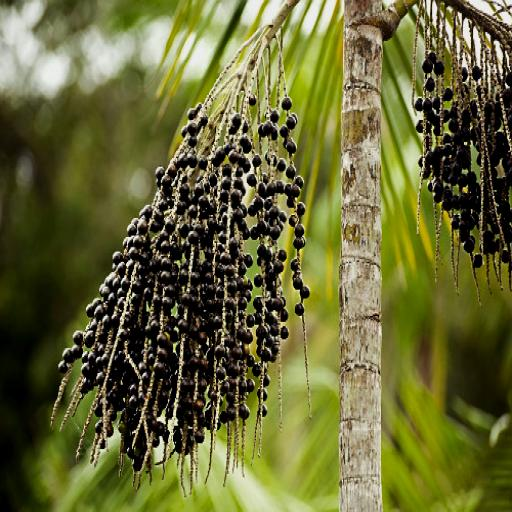

In [9]:
from pathlib import Path
from PIL import Image

root = Path(out_dir)
img_paths = sorted((root / "train" / "images").glob("*.*"))
print("Num train images:", len(img_paths))

Image.open(img_paths[0])

In [10]:
import os
for r, d, f in os.walk("/content/roboflow_dataset"):
    if r.endswith("images"):
        print(r, "->", len(f), "files")

/content/roboflow_dataset/valid/images -> 3 files
/content/roboflow_dataset/train/images -> 36 files
/content/roboflow_dataset/test/images -> 1 files


In [11]:
from roboflow import Roboflow
rf = Roboflow(api_key="JvE3dIqiHY5XNHhSOQ5p")
project = rf.workspace("anas-workspace-5npb9").project("acai-v4l4k")
print(f"Available versions for project '{project.name}':")
for v in project.versions():
    print(f"- Version {v.version}: {v.name}")

# IMPORTANT: After seeing the available versions, please replace <YOUR_VALID_VERSION_NUMBER_OR_NAME_HERE> with a valid one.
# For example: version = project.version(1) or version = project.version('my_dataset_v1')
# Then uncomment the following two lines:
# version = project.version(<YOUR_VALID_VERSION_NUMBER_OR_NAME_HERE>)
# dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...
Available versions for project 'açai':
- Version 2: açai
- Version 1: açai


In [12]:
import os

# Define o caminho base para a pasta de imagens de validação
# Corrigido para o caminho real onde o dataset foi extraído.
base_image_dir = "/content/roboflow_dataset/valid/images"

# Lista os arquivos no diretório e filtra por extensões de imagem comuns
image_files = [f for f in os.listdir(base_image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tiff'))]

# Verifica se alguma imagem foi encontrada
if image_files:
    # Seleciona a primeira imagem encontrada
    image_filename = image_files[0]
    image_path = os.path.join(base_image_dir, image_filename)

    print(f"Tentando prever com a imagem: {image_path}")

    # Tenta fazer a predição
    try:
        results = model.predict(image_path, save=True)
        # Mostrar máscaras detectadas
        if results:
            from IPython.display import Image, display

            # Display the result directly using plot() which returns a PIL Image or numpy array
            # The `plot()` method returns a numpy array, which can be saved or displayed.
            img_with_preds = results[0].plot()
            display(Image(data=img_with_preds))

        else:
            print("Nenhum resultado de previsão foi retornado para a imagem.")
    except Exception as e:
        print(f"Ocorreu um erro durante a predição: {e}")
else:
    print(f"Erro: Nenhuma imagem encontrada no diretório: {base_image_dir}")
    print("Por favor, verifique o caminho do diretório e se ele contém arquivos de imagem válidos.")

Tentando prever com a imagem: /content/roboflow_dataset/valid/images/151480040m_jpg.rf.a7eb49e9723eeb00092b6eca0d2a077b.jpg
Ocorreu um erro durante a predição: name 'model' is not defined


In [13]:
!pip install roboflow
!pip install ultralytics
from roboflow import Roboflow
from ultralytics import YOLO



In [14]:
rf = Roboflow(api_key="JvE3dIqiHY5XNHhSOQ5p")
project = rf.workspace("anas-workspace-5npb9").project("acai-v4l4k")
version = project.version(1)
dataset = version.download("yolov11")


loading Roboflow workspace...
loading Roboflow project...


In [15]:
import os
from ultralytics import YOLO # Ensure YOLO is imported
from roboflow import Roboflow

# Initialize Roboflow and download dataset
rf = Roboflow(api_key="JvE3dIqiHY5XNHhSOQ5p")
project = rf.workspace("anas-workspace-5npb9").project("acai-v4l4k")
version = project.version(1)
dataset = version.download("yolov11")

# carregar modelo
model = YOLO("yolo11l-seg.pt") # Initialize the model

# treinar
model.train(
    data=os.path.join(dataset.location, "data.yaml"),
    epochs=5,         # mais épocas para convergência melhor
    imgsz=640,         # imagens maiores para detalhes
    batch=16,           # aproveitando os 16GB da GPU
    workers=8,          # pode aumentar se sua máquina tiver muitos núcleos
    project="usmb-3ou0v",
    name="exp_highres"
)

loading Roboflow workspace...
loading Roboflow project...
Ultralytics 8.4.90 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/açai-1/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11l-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=exp_highres, nbs=64, nms=False, opset=None, 

ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78e43ffc5460>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041, 